### Data analysis of Section 11 data.

1. Check all 6 surface maps without thermal compensation
1. Check all 6 surface maps with thermal compensation (due to poor thermal condition, we had to use these for optimization)
1. Make T maps for each surface
2. Plot the RB corrections as a function of iteration.
2. Plot bending force RMS as a function of iteration.
2. Spot check the forces applied at each iteration were applied as intended (Gravity+optimized+bending)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.jet()

import sys
sys.path.insert(0, '../')
from M1S_tools import *
import glob

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
## bending modes & influence matrices etc from Buddy #####################
ML actuators =  165 165
Afn =  (6991, 165)
fv =  (165, 165)
U matrix (6991, 165)
N node =  6991
## bending modes & influence matrices etc from Trupti #####################
N actuators =  170
/Users/bxin/Library/CloudStorage/OneDrive-SharedLibraries-GMTOCorp/M1S Portal - Documents/influnce_matrix_files/OA_influence_matrices_all/OA_surface_normal_165SA_09Jan2025/
Afz =  (27547, 165)
Afx =  (27547, 165)
Afy =  (27547, 165)
U

<Figure size 640x480 with 0 Axes>

In [2]:
ml_data_dir = "/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data/"
dateID = '250130'

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_1/250130 GMT3 set1 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_2/250130 GMT3 set2 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_3/250130 GMT3 set3 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_4/250130 GMT3 set4 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_5/250130 GMT3 set5 gmtMorph170614 LFSsub comp - stitched patched 14 -.h5: date not in h5 file. 


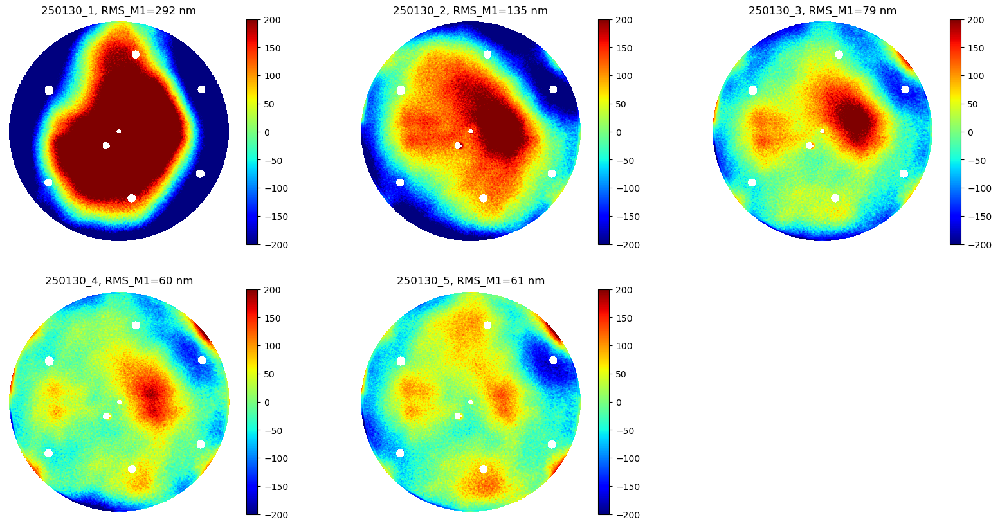

In [3]:
fig, ax = plt.subplots(2,3,figsize=(20,10))
for i in range(5):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    
    fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched -.h5'%(ml_data_dir,dateID, i+1, dateID)))
    if len(fileset)==0:
        fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched 14 -.h5'%(ml_data_dir,dateID, i+1, dateID)))

    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title('%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')
for i in np.arange(5, 2*3):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    ax[irow][icol].axis('off')    

In [4]:
#no timestamp in the above h5 files
h5file = fileset[0]
print(h5file)
f = h5py.File(h5file,'r')
print(f.keys())
data0 = f['dataset']
print(data0.attrs.keys())
print('date' in data0.attrs.keys())

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_5/250130 GMT3 set5 gmtMorph170614 LFSsub comp - stitched patched 14 -.h5
<KeysViewHDF5 ['dataset', 'measurement0']>
<KeysViewHDF5 ['CA_rms', 'FA_rms', 'Files', 'LFS_subtracted', 'averages', 'centerCol', 'centerRow', 'comaTest', 'compensated', 'data_source', 'description', 'morphed', 'pixelSize', 'poly_subtracted', 'units']>
False


In [5]:
#we have to retrieve timestamps from earlier stage data files
#below is only for retrieving timestamps
ts_array = []
for i in range(5):
    globstring = '%s/Sec 11/14 modes/%s_%s/%s*set*comp -.h5'%(ml_data_dir,dateID, i+1, dateID)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    temp,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)
    ts_array.append(ts)

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_1/250130 GMT3 set1 gmtMorph170614 LFSsub comp -.h5: Thu Jan 30 12:24:52 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_2/250130 GMT3 set2 gmtMorph170614 LFSsub comp -.h5: Thu Jan 30 12:42:09 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_3/250130 GMT3 set3 gmtMorph170614 LFSsub comp -.h5: Thu Jan 30 12:58:01 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_4/250130 GMT3 set4 gmtMorph170614 LFSsub comp -.h5: Thu Jan 30 13:15:11 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_5/250130 GMT3 set5 gmtMorph170614 LFSsub comp -.h5: Thu Jan 30 13:29:31 2025 


In [11]:
# below we get x and y for OW tc's ready, so that after we query and get z=tc[idx_mirror_ow]
#.    we can simply use scatter() to show the values on images in optical/h5 CS.
expandF = np.ones(sum(idx_mirror_ow))*1.1
expandF[tc_locs[idx_mirror_ow,2]>-0.3]=1.18 #back plate
expandF[tc_locs[idx_mirror_ow,2]<-0.6]=1.05 #front plate
xow = tc_locs[idx_mirror_ow,1]*expandF/pixelSize+centerCol #flip x/y to get into Opitical/h5 CS
yow = tc_locs[idx_mirror_ow,0]*expandF/pixelSize+centerRow
xow0 = xow-centerCol #in pixel, but zero is at image center
yow0=  yow-centerRow
row=np.round(np.sqrt(xow0**2+yow0**2),0) #radii of 3 rings in pixel
row_unique=np.sort(np.unique(row))
row_label=['Front','Middle', 'Back']
row_linestyle = ['-','--','-.']

print('Sanity checks:')
idx = (xow>750) & (yow0>50) #visually locating 3 TCs at 30deg azimuth (in OCS)
print(np.rad2deg(np.arctan2(yow0[idx], xow0[idx])), ' deg --> check that they are aligned radially, yes')
print('if I use my x,y on the tc_labels list, I get')
tc_labels_36 = [t for t,i in zip(tc_labels, idx_mirror_ow) if i]
label3 = [t for t,i in zip(tc_labels_36, idx) if i]
print(label3, ' --> This match Mirror lab drawing; 3 OW TCs in Core F222')
print(xow[idx], ' --> yes, B has larger radius, then M, then F; B and M were same, but I shifted them.')

Sanity checks:
[29.99999833 29.99999833 30.00019196]  deg --> check that they are aligned radially, yes
if I use my x,y on the tc_labels list, I get
['MTCOW011B', 'MTCOW011M', 'MTCOW011F']  --> This match Mirror lab drawing; 3 OW TCs in Core F222
[853.49401815 824.57916946 798.28903   ]  --> yes, B has larger radius, then M, then F; B and M were same, but I shifted them.


### Replot the optimization process by adding OW T values

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_1/250130 GMT3 set1 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 12:09:52  duration =  360  s
(18, 6, 32)
(18, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_2/250130 GMT3 set2 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 12:27:09  duration =  360  s
(18, 6, 32)
(18, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_3/250130 GMT3 set3 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 12:43:01  duration =  360  s
(18, 6, 32)
(18, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_4/250130 GMT3 set4 gmtMorph170614 LFSsub comp - stitched patched -.h5

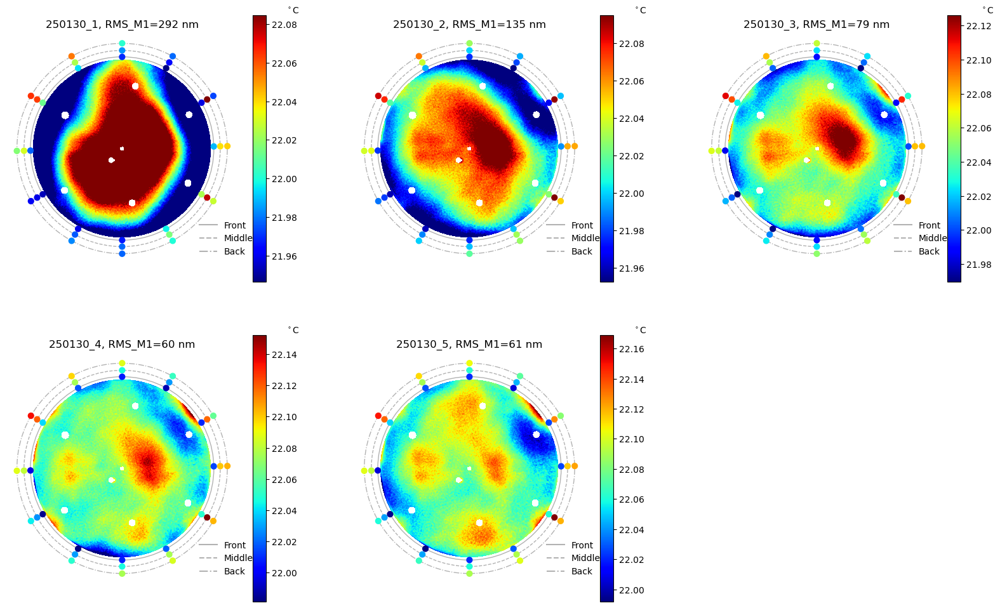

In [13]:
fig, ax = plt.subplots(2,3,figsize=(20,12))
for i in range(5):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    
    fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched -.h5'%(ml_data_dir,dateID, i+1, dateID)))
    if len(fileset)==0:
        fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched 14 -.h5'%(ml_data_dir,dateID, i+1, dateID)))

    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    ax[irow][icol].set_title('%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')
    
    #Each optimization took about 15 minutes, but data acquisition was 6 minutes, at the end which file was saved
    tc, tt = getDBData(unix_ts(ts_array[i])-60*5,'m1_s1_thermal_ctrl/i/tc_temperature/value', duration_in_s=60*2, samples=100)
    tc = np.mean(tc, axis=0)
    for j,rpix in enumerate(row_unique):
        circle = plt.Circle((centerCol, centerRow), rpix, alpha=0.3, fill=False, linestyle=row_linestyle[j])
        ax[irow][icol].plot([0],[0], alpha=0.3, color='k', label=row_label[j], linestyle=row_linestyle[j])
        ax[irow][icol].add_patch(circle)
    sc = ax[irow][icol].scatter(xow,yow, 40, c=tc[idx_mirror_ow])
    cbar = fig.colorbar(sc, ax=ax[irow][icol])
    cbar.ax.text(3, 1.0, r'$^\circ$C', ha='center', va='bottom', transform=cbar.ax.transAxes)
    ax[irow][icol].legend(loc='lower right', bbox_to_anchor=(1.1, 0), frameon=False)
    
for i in np.arange(5, 2*3):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    ax[irow][icol].axis('off')   

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_1/250130 GMT3 set1 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_4/250130 GMT3 set4 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 


(-0.5, 852.5, -0.5, 852.5)

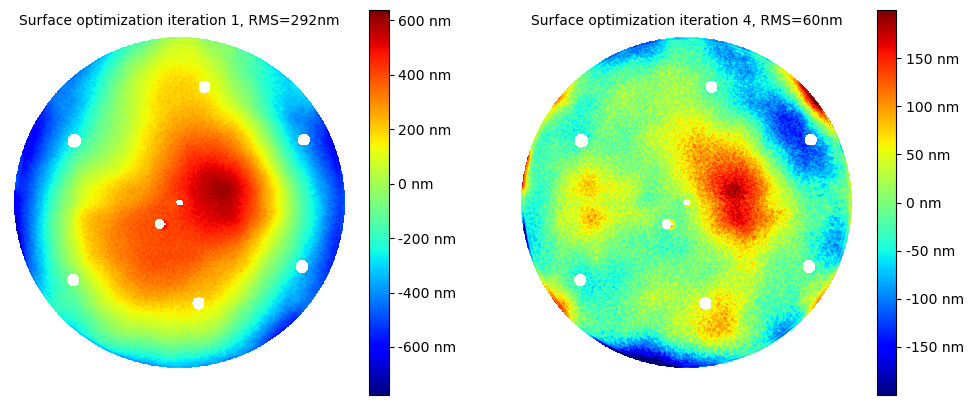

In [14]:
#make a plot for Barbara
fig, ax = plt.subplots(1,2,figsize=(12,5))

i = 0
fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched -.h5'%(ml_data_dir,dateID, i+1, dateID)))
assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)

img = ax[0].imshow(m1s*1e3, origin='lower')#, vmin=-200, vmax=200)
cbar = fig.colorbar(img, ax=ax[0])
m1rms = np.std(m1s[~np.isnan(m1s)])*1e3
mytitle = 'Surface optimization iteration %d, RMS=%.0fnm'%(i+1, m1rms)
ax[0].set_title(mytitle, fontsize=10)
ticks = cbar.get_ticks()[1:-1]
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{tick:.0f} nm" for tick in ticks])
ax[0].axis('off')

i = 3 #iter 4
fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched -.h5'%(ml_data_dir,dateID, i+1, dateID)))
assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)

img = ax[1].imshow(m1s*1e3, origin='lower', vmin=-200, vmax=200)
cbar = fig.colorbar(img, ax=ax[1])
m1rms = np.std(m1s[~np.isnan(m1s)])*1e3
mytitle = 'Surface optimization iteration %d, RMS=%.0fnm'%(i+1, m1rms)
ax[1].set_title(mytitle, fontsize=10)
ticks = cbar.get_ticks()[1:-1]
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{tick:.0f} nm" for tick in ticks])
ax[1].axis('off')

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_1/250130 GMT3 set1 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_2/250130 GMT3 set2 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_3/250130 GMT3 set3 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_4/250130 GMT3 set4 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_5/250130 GMT3 set5 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 


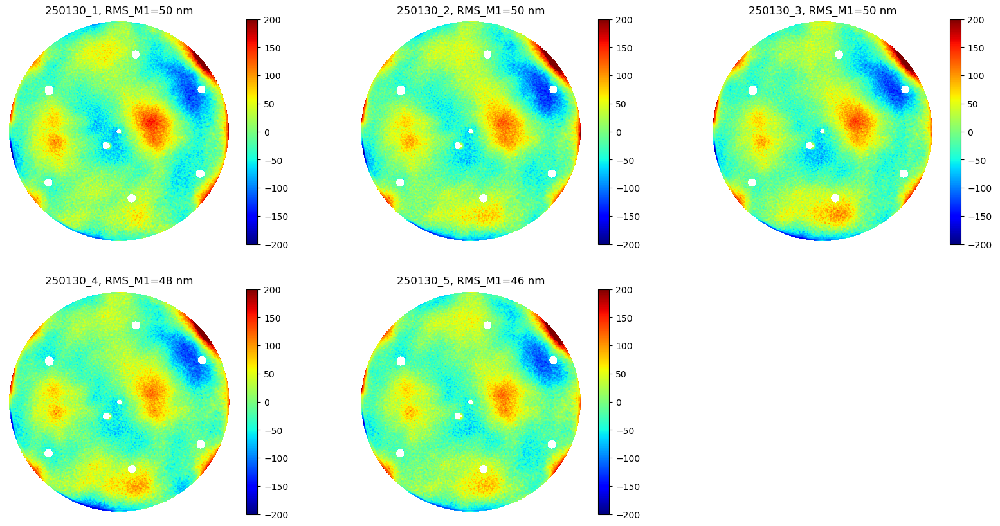

In [15]:
fig, ax = plt.subplots(2,3,figsize=(20,10))
for i in range(5):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    
    fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched - 14 GMT modes -.h5'%(ml_data_dir,dateID, i+1, dateID)))

    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title('%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')
for i in np.arange(5, 2*3):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    ax[irow][icol].axis('off')    

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_1/250130 GMT3 set1 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 12:09:52  duration =  360  s
(18, 6, 32)
(18, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_2/250130 GMT3 set2 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 12:27:09  duration =  360  s
(18, 6, 32)
(18, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_3/250130 GMT3 set3 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 12:43:01  duration =  360  s
(18, 6, 32)
(18, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_4/250130 GMT3 set4 gmtMo

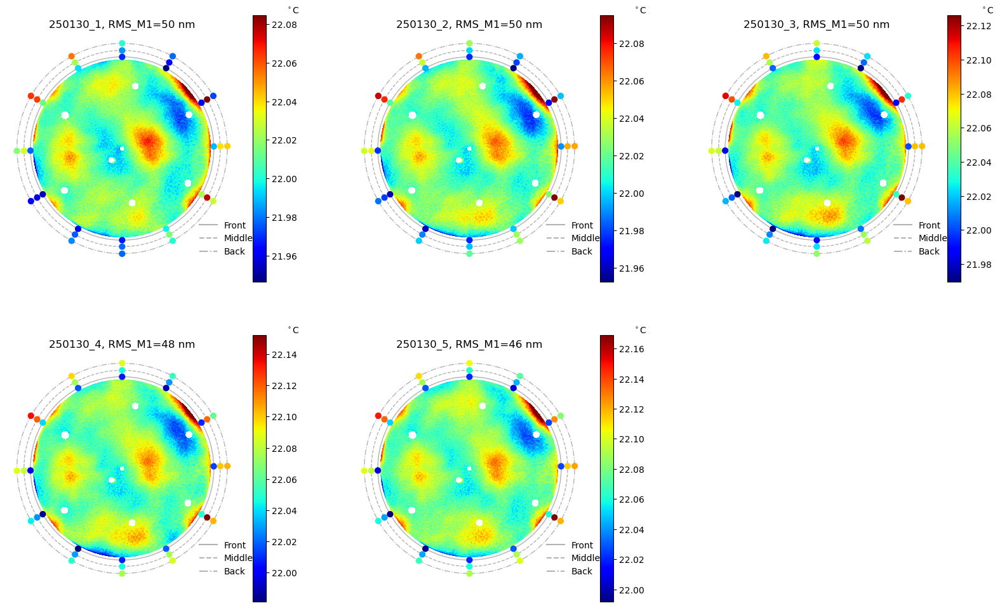

In [17]:
fig, ax = plt.subplots(2,3,figsize=(20,12))
for i in range(5):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    
    fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched - 14 GMT modes*.h5'%(ml_data_dir,dateID, i+1, dateID)))

    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    ax[irow][icol].set_title('%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')
    
    #Each optimization took about 15 minutes, but data acquisition was 6 minutes, at the end which file was saved
    tc, tt = getDBData(unix_ts(ts_array[i])-60*5,'m1_s1_thermal_ctrl/i/tc_temperature/value', duration_in_s=60*2, samples=100)
    tc = np.mean(tc, axis=0)
    for j,rpix in enumerate(row_unique):
        circle = plt.Circle((centerCol, centerRow), rpix, alpha=0.3, fill=False, linestyle=row_linestyle[j])
        ax[irow][icol].plot([0],[0], alpha=0.3, color='k', label=row_label[j], linestyle=row_linestyle[j])
        ax[irow][icol].add_patch(circle)
    sc = ax[irow][icol].scatter(xow,yow, 40, c=tc[idx_mirror_ow])
    cbar = fig.colorbar(sc, ax=ax[irow][icol])
    cbar.ax.text(3, 1.0, r'$^\circ$C', ha='center', va='bottom', transform=cbar.ax.transAxes)
    ax[irow][icol].legend(loc='lower right', bbox_to_anchor=(1.1, 0), frameon=False)
    
for i in np.arange(5, 2*3):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    ax[irow][icol].axis('off')   

----------------   Thu Jan 30 12:24:52 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 12:24:52  duration =  100  s
(1, 6, 32)
(1, 192)
----------------   Thu Jan 30 12:42:09 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 12:42:09  duration =  100  s
(1, 6, 32)
(1, 192)
----------------   Thu Jan 30 12:58:01 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 12:58:01  duration =  100  s
(1, 6, 32)
(1, 192)
----------------   Thu Jan 30 13:15:11 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 13:15:11  duration =  100  s
(1, 6, 32)
(1, 192)
----------------   Thu Jan 30 13:29:31 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-30 13:29:31  duration =  100  s
(1, 6, 32)
(1, 192)


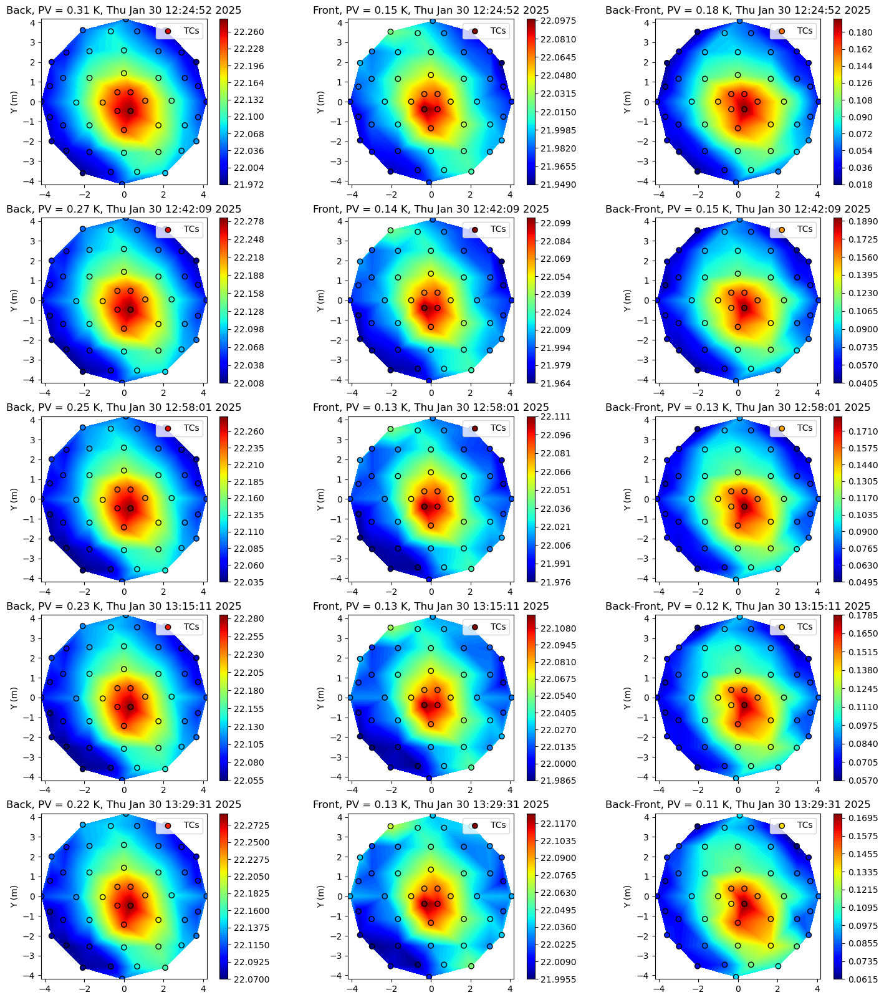

In [18]:
showTMaps(ts_array)

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_1/250130 GMT3 set1 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_2/250130 GMT3 set2 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_3/250130 GMT3 set3 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_4/250130 GMT3 set4 gmtMorph170614 LFSsub comp - stitched patched -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_5/250130 GMT3 set5 gmtMorph170614 LFSsub comp - stitched patched 14 -.h5: date not in h5 file. 


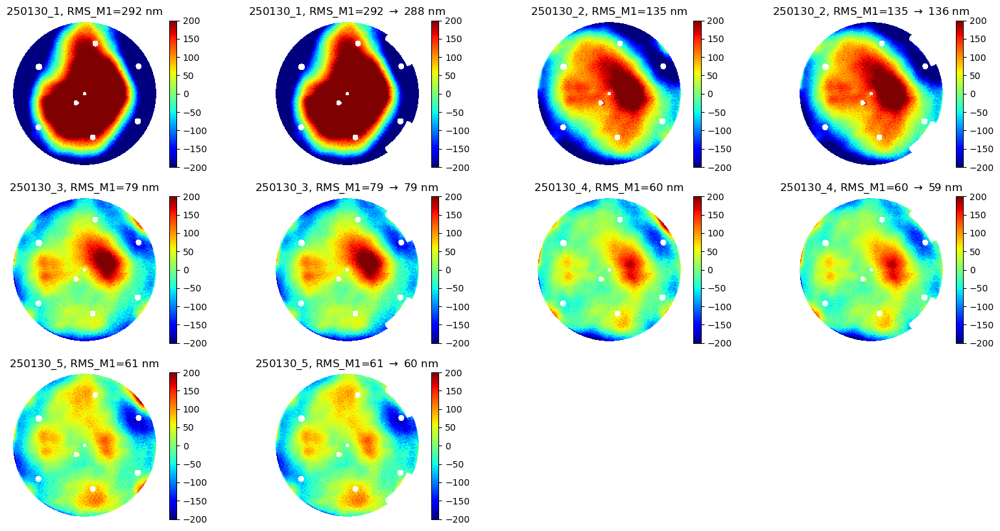

In [19]:
dateID = '250130'
assert len(ts_array)==5

[x1, y1] = mkXYGrid(m1s, centerRow,centerCol, pixelSize)
r1 = np.sqrt(x1**2+y1**2)
theta1 = np.rad2deg(np.arctan2(y1, x1))
center1 = 40
delta1 = 15
center2 = -40
delta2 = 15
r_cut = 3.85
idx1 = (theta1>center1-delta1) & (theta1<center1+delta1) & (r1>r_cut)
idx2 = (theta1>center2-delta2) & (theta1<center2+delta2) & (r1>r_cut)

fig, ax = plt.subplots(3,4,figsize=(20,10))
j = 0
for i in range(5):
    irow = np.int8(j/4)
    icol = np.mod(j,4)
    j+=1
    
    fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched -.h5'%(ml_data_dir,dateID, i+1, dateID)))
    if len(fileset)==0:
        fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched 14 -.h5'%(ml_data_dir,dateID, i+1, dateID)))

    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title(r'%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')  
    
    irow = np.int8(j/4)
    icol = np.mod(j,4)
    j+=1
    
    #idx1 = m1s>60
    #idx2 = m1s<-60
    m1s[idx1] = np.nan
    m1s[idx2] = np.nan
    m1rms_cut = np.std(m1s[~np.isnan(m1s)])
    
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title(r'%s_%s, RMS_M1=%.0f $\rightarrow$ %.0f nm'%(dateID,i+1, m1rms,m1rms_cut))
    ax[irow][icol].axis('off')  
for i in range(j, 3*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off') 

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_1/250130 GMT3 set1 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_2/250130 GMT3 set2 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_3/250130 GMT3 set3 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_4/250130 GMT3 set4 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/14 modes/250130_5/250130 GMT3 set5 gmtMorph170614 LFSsub comp - stitched patched - 14 GMT modes -.h5: date not in h5 file. 


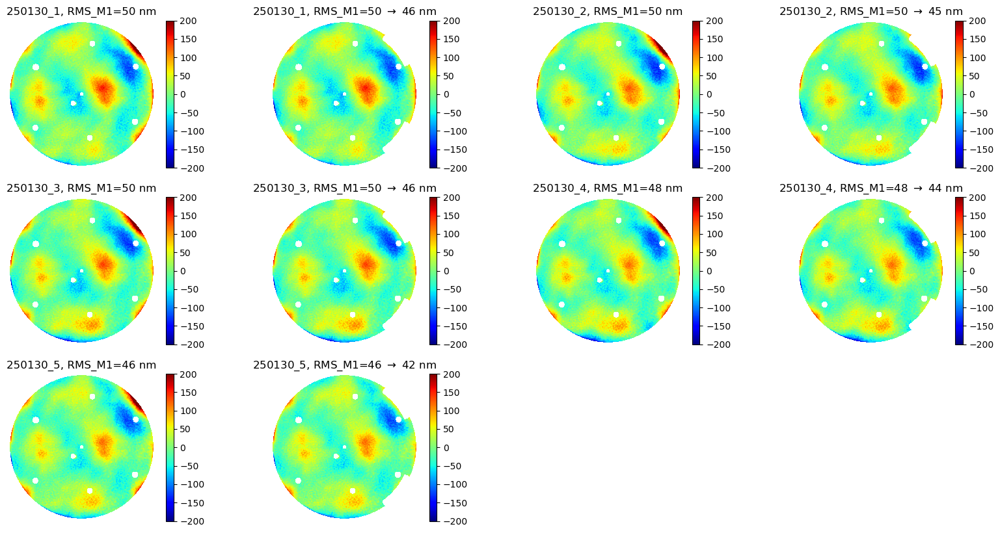

In [20]:
dateID = '250130'

fig, ax = plt.subplots(3,4,figsize=(20,10))
j = 0
for i in range(5):
    irow = np.int8(j/4)
    icol = np.mod(j,4)
    j+=1
    
    fileset = sorted(glob.glob('%s/Sec 11/14 modes/%s_%s/%s*set*patched - 14 GMT modes -.h5'%(ml_data_dir,dateID, i+1, dateID)))

    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title(r'%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')  
    
    irow = np.int8(j/4)
    icol = np.mod(j,4)
    j+=1
    
    #idx1 = m1s>60
    #idx2 = m1s<-60
    m1s[idx1] = np.nan
    m1s[idx2] = np.nan
    m1rms_cut = np.std(m1s[~np.isnan(m1s)])
    
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title(r'%s_%s, RMS_M1=%.0f $\rightarrow$ %.0f nm'%(dateID,i+1, m1rms,m1rms_cut))
    ax[irow][icol].axis('off')  
for i in range(j, 3*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off') 

## Moving onto RB + 27 BMs

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_1/250131 GMT3 set1 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_2/250131 GMT3 set2 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_3/250131 GMT3 set3 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_4/250131 GMT3 set4 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_5/250131 GMT3 set5 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 mod

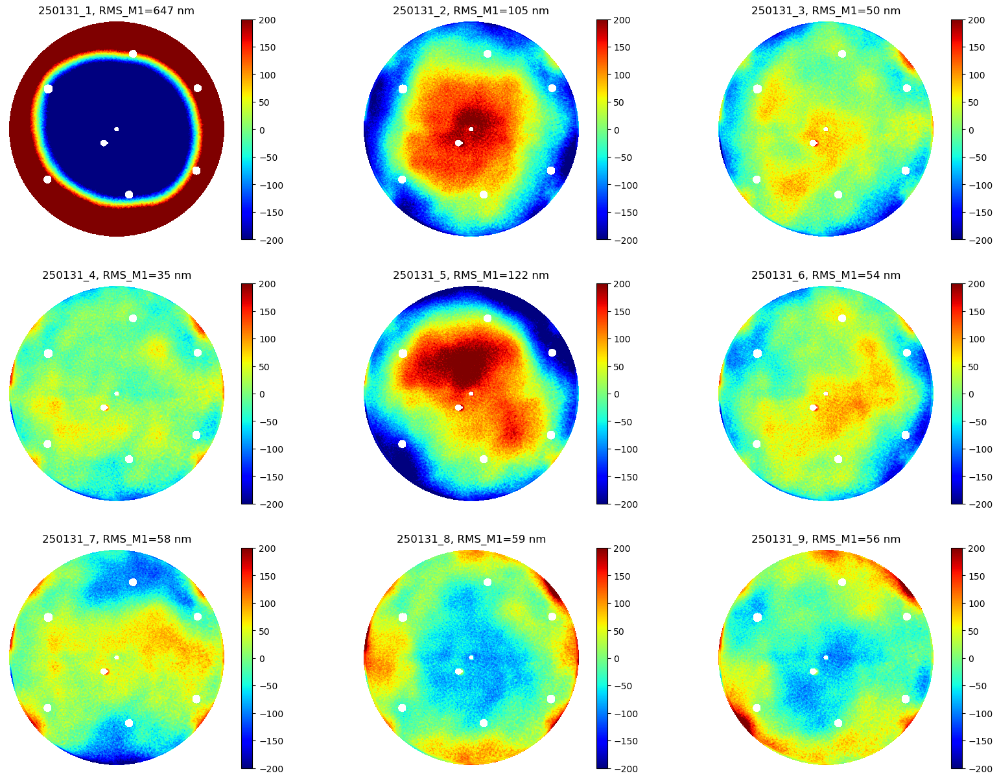

In [21]:
dateID = '250131'
fig, ax = plt.subplots(3,3,figsize=(20,15))
for i in range(9):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    
    globstring = '%s/Sec 11/27 modes/%s_%s/%s*set*patched.h5'%(ml_data_dir,dateID, i+1, dateID)
    #print(globstring)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow1,centerCol1,pixelSize1,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title('%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')

In [90]:
#we have to retrieve timestamps from earlier stage data files
#below is only for retrieving timestamps
ts_array = []
for i in range(9):
    globstring = '%s/Sec 11/27 modes/%s_%s/%s*set*comp -.h5'%(ml_data_dir,dateID, i+1, dateID)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    temp,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)
    ts_array.append(ts)

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_1/250131 GMT3 set1 27 modes gmtMorph170614 LFSsub comp -.h5: Fri Jan 31 10:25:48 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_2/250131 GMT3 set2 27 modes gmtMorph170614 LFSsub comp -.h5: Fri Jan 31 10:48:11 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_3/250131 GMT3 set3 27 modes gmtMorph170614 LFSsub comp -.h5: Fri Jan 31 11:02:05 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_4/250131 GMT3 set4 27 modes gmtMorph170614 LFSsub comp -.h5: Fri Jan 31 11:15:23 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_5/250131 GMT3 set5 27 modes gmtMorph170614 LFSsub comp -.h5: Fri Jan 31 11:31:12 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_6/250131 GMT3 set6 27 modes gmtMorph170614 LFSsub comp 

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_1/250131 GMT3 set1 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 10:20:48  duration =  120  s
(6, 6, 32)
(6, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_2/250131 GMT3 set2 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 10:43:11  duration =  120  s
(6, 6, 32)
(6, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_3/250131 GMT3 set3 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 10:57:05  duration =  120  s
(6, 6, 32)
(6, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_4/250131 GMT3 set4 27 modes gmtMorph170614 LFSsub comp

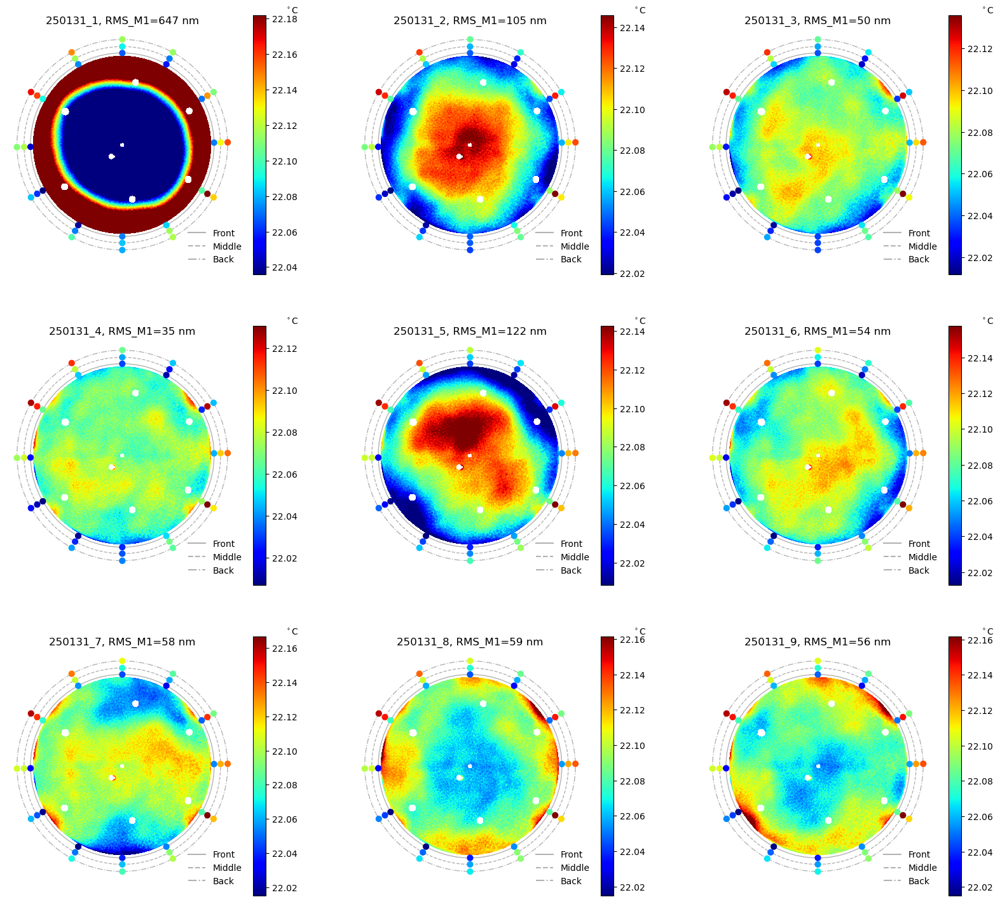

In [91]:
fig, ax = plt.subplots(3,3,figsize=(20,18))
for i in range(9):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    
    globstring = '%s/Sec 11/27 modes/%s_%s/%s*set*patched.h5'%(ml_data_dir,dateID, i+1, dateID)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    ax[irow][icol].set_title('%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')
    
    #Each optimization took about 15 minutes, but data acquisition was 6 minutes, at the end which file was saved
    tc, tt = getDBData(unix_ts(ts_array[i])-60*5,'m1_s1_thermal_ctrl/i/tc_temperature/value', duration_in_s=60*2, samples=100)
    tc = np.mean(tc, axis=0)
    for j,rpix in enumerate(row_unique):
        circle = plt.Circle((centerCol, centerRow), rpix, alpha=0.3, fill=False, linestyle=row_linestyle[j])
        ax[irow][icol].plot([0],[0], alpha=0.3, color='k', label=row_label[j], linestyle=row_linestyle[j])
        ax[irow][icol].add_patch(circle)
    sc = ax[irow][icol].scatter(xow,yow, 40, c=tc[idx_mirror_ow])
    cbar = fig.colorbar(sc, ax=ax[irow][icol])
    cbar.ax.text(3, 1.0, r'$^\circ$C', ha='center', va='bottom', transform=cbar.ax.transAxes)
    ax[irow][icol].legend(loc='lower right', bbox_to_anchor=(1.05, -.05), frameon=False)

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_1/250131 GMT3 set1 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_2/250131 GMT3 set2 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_3/250131 GMT3 set3 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_4/250131 GMT3 set4 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_5/250131 GMT3 set5 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 


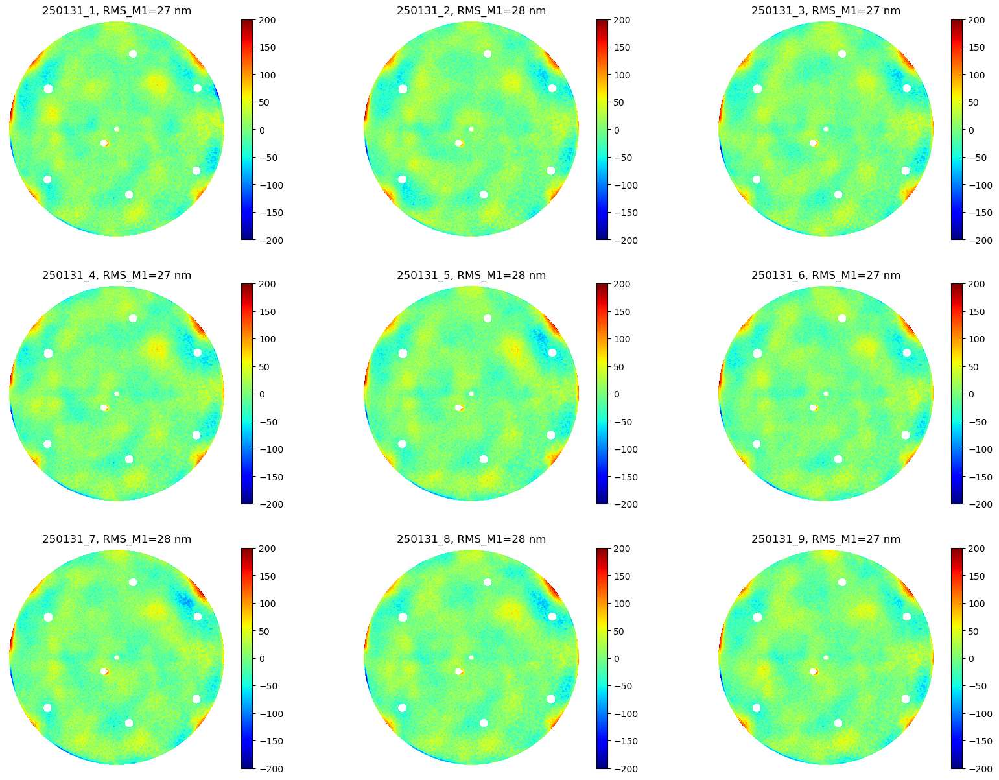

In [92]:
dateID = '250131'
fig, ax = plt.subplots(3,3,figsize=(20,15))
for i in range(9):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    
    globstring = '%s/Sec 11/27 modes/%s_%s/%s*set*patched - 27 GMT modes.h5'%(ml_data_dir,dateID, i+1, dateID)
    #print(globstring)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow1,centerCol1,pixelSize1,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title('%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')
for i in np.arange(5, 2*3):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    ax[irow][icol].axis('off')  

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_1/250131 GMT3 set1 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 10:20:48  duration =  120  s
(6, 6, 32)
(6, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_2/250131 GMT3 set2 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 10:43:11  duration =  120  s
(6, 6, 32)
(6, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_3/250131 GMT3 set3 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 10:57:05  duration =  120  s
(6, 6, 32)
(6, 192)
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_4/250131 

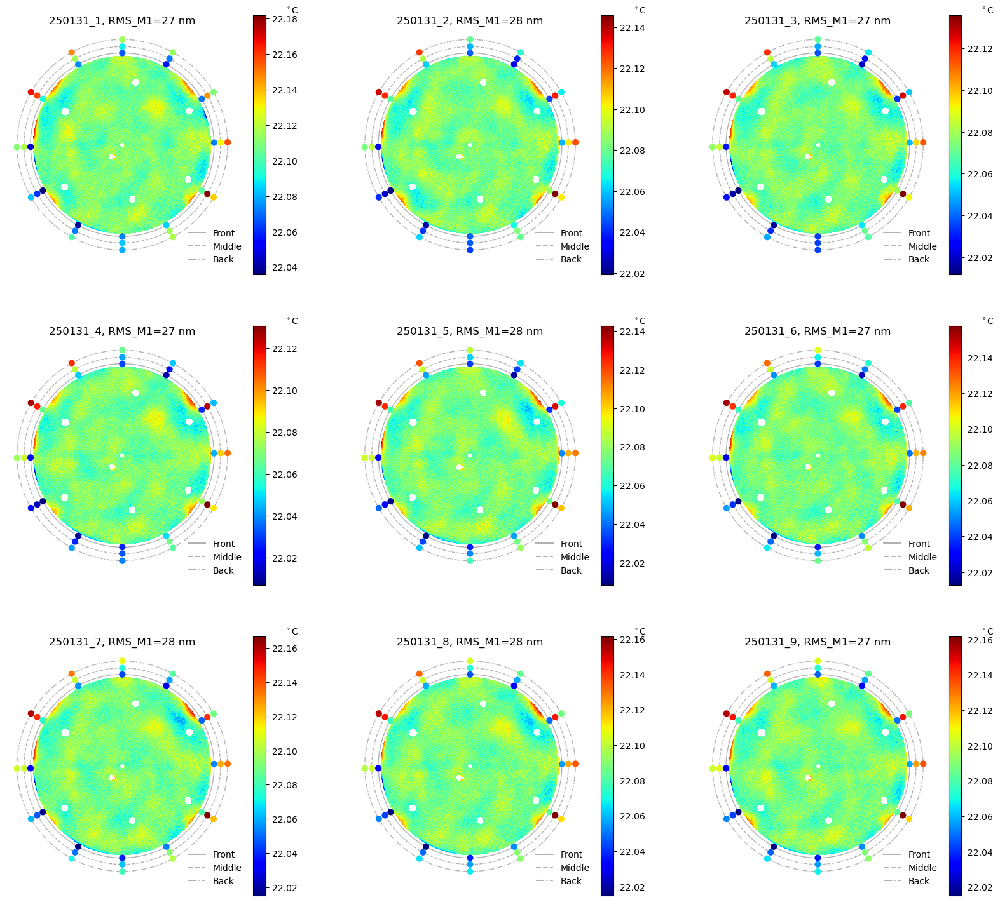

In [93]:
fig, ax = plt.subplots(3,3,figsize=(20,18))
for i in range(9):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    
    globstring = glob.glob('%s/Sec 11/27 modes/%s_%s/%s*set*patched - 27 GMT modes.h5'%(ml_data_dir,dateID, i+1, dateID))
    fileset = sorted(globstring)
    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    ax[irow][icol].set_title('%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')
    
    #Each optimization took about 15 minutes, but data acquisition was 6 minutes, at the end which file was saved
    tc, tt = getDBData(unix_ts(ts_array[i])-60*5,'m1_s1_thermal_ctrl/i/tc_temperature/value', duration_in_s=60*2, samples=100)
    tc = np.mean(tc, axis=0)
    for j,rpix in enumerate(row_unique):
        circle = plt.Circle((centerCol, centerRow), rpix, alpha=0.3, fill=False, linestyle=row_linestyle[j])
        ax[irow][icol].plot([0],[0], alpha=0.3, color='k', label=row_label[j], linestyle=row_linestyle[j])
        ax[irow][icol].add_patch(circle)
    sc = ax[irow][icol].scatter(xow,yow, 40, c=tc[idx_mirror_ow])
    cbar = fig.colorbar(sc, ax=ax[irow][icol])
    cbar.ax.text(3, 1.0, r'$^\circ$C', ha='center', va='bottom', transform=cbar.ax.transAxes)
    ax[irow][icol].legend(loc='lower right', bbox_to_anchor=(1.05, -.05), frameon=False)

----------------   Fri Jan 31 10:25:48 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 10:25:48  duration =  100  s
(1, 6, 32)
(1, 192)
----------------   Fri Jan 31 10:48:11 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 10:48:11  duration =  100  s
(1, 6, 32)
(1, 192)
----------------   Fri Jan 31 11:02:05 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 11:02:05  duration =  100  s
(1, 6, 32)
(1, 192)
----------------   Fri Jan 31 11:15:23 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 11:15:23  duration =  100  s
(1, 6, 32)
(1, 192)
----------------   Fri Jan 31 11:31:12 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 11:31:12  duration =  100  s
(1, 6, 32)
(1, 192)
----------------   Fri Jan 31 11:44:33 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 11:44:33  duration =  100  s
(1, 6, 32)
(1, 192)
----------------   Fri Jan 31 11:57:41 2025
m1_s1_thermal_ctrl/i/tc_temperature/value
2025-01-31 11:57:41  duration =  100  

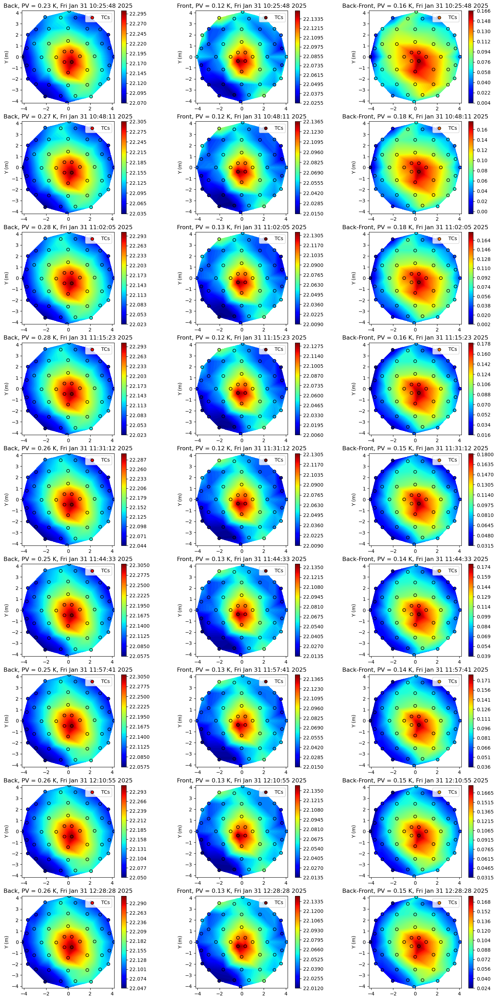

In [94]:
showTMaps(ts_array)

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_1/250131 GMT3 set1 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_2/250131 GMT3 set2 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_3/250131 GMT3 set3 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_4/250131 GMT3 set4 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_5/250131 GMT3 set5 27 modes gmtMorph170614 LFSsub comp - stitched patched.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 mod

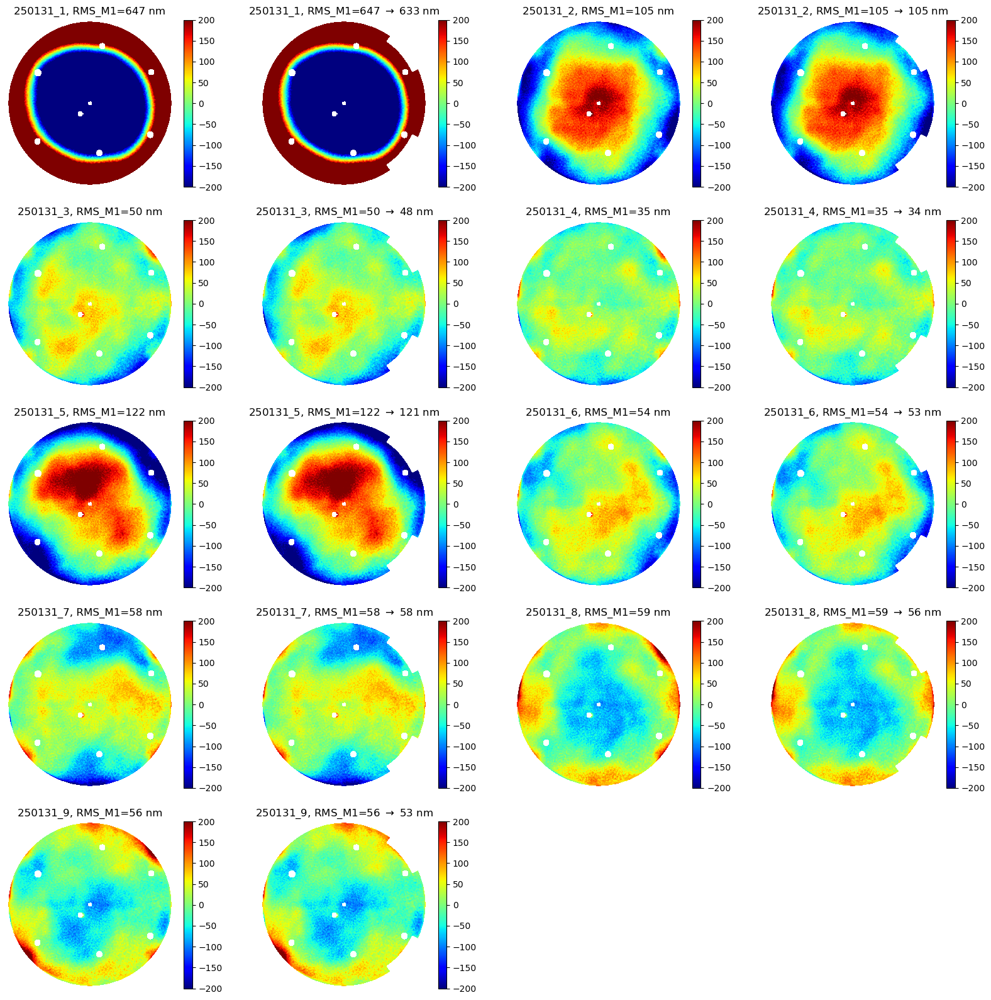

In [95]:
dateID = '250131'
fig, ax = plt.subplots(5,4,figsize=(20,20))
j = 0
for i in range(9):
    irow = np.int8(j/4)
    icol = np.mod(j,4)
    j+=1
    
    globstring = '%s/Sec 11/27 modes/%s_%s/%s*set*patched.h5'%(ml_data_dir,dateID, i+1, dateID)
    #print(globstring)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow1,centerCol1,pixelSize1,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title('%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')
    
    irow = np.int8(j/4)
    icol = np.mod(j,4)
    j+=1
    
    #idx1 = m1s>60
    #idx2 = m1s<-60
    m1s[idx1] = np.nan
    m1s[idx2] = np.nan
    m1rms_cut = np.std(m1s[~np.isnan(m1s)])
    
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title(r'%s_%s, RMS_M1=%.0f $\rightarrow$ %.0f nm'%(dateID,i+1, m1rms,m1rms_cut))
    ax[irow][icol].axis('off')  
for i in range(j, 5*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off') 

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_1/250131 GMT3 set1 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_2/250131 GMT3 set2 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_3/250131 GMT3 set3 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_4/250131 GMT3 set4 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_5/250131 GMT3 set5 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 


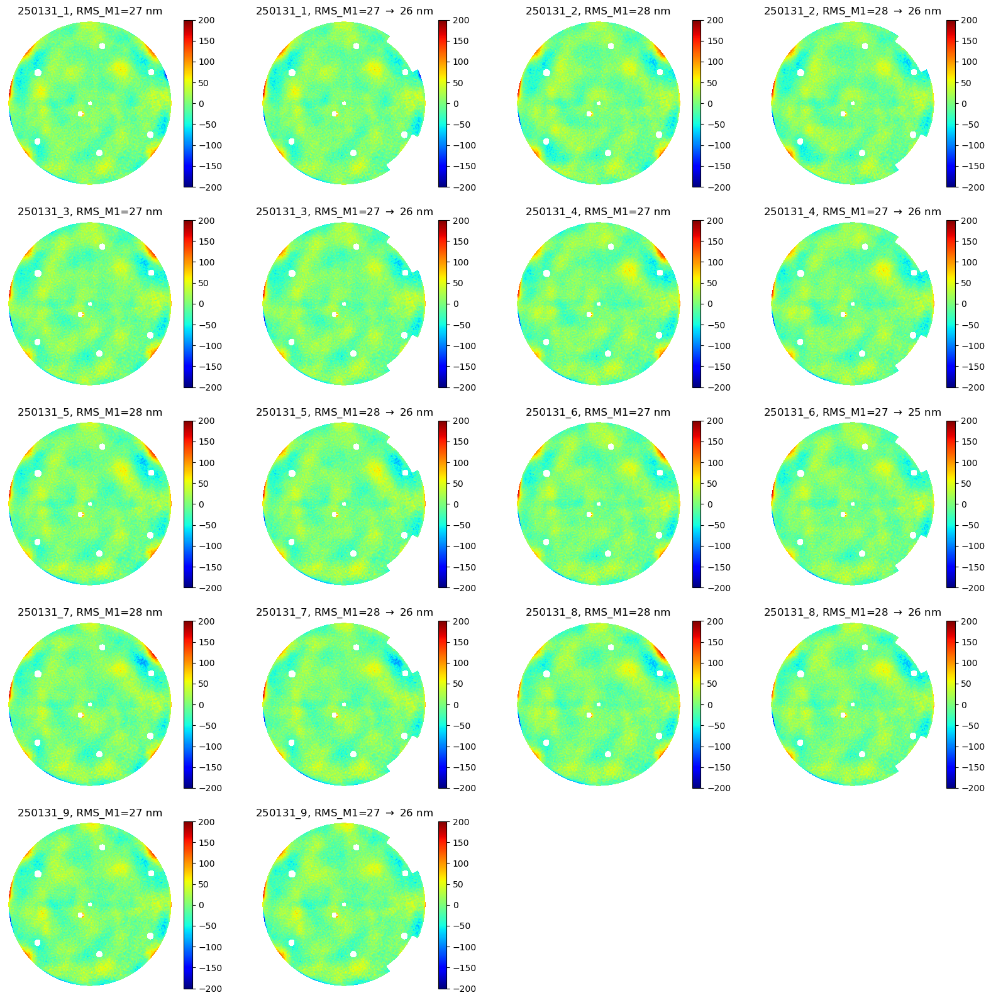

In [96]:
dateID = '250131'
fig, ax = plt.subplots(5,4,figsize=(20,20))
j = 0
for i in range(9):
    irow = np.int8(j/4)
    icol = np.mod(j,4)
    j+=1
    
    globstring = '%s/Sec 11/27 modes/%s_%s/%s*set*patched - 27*.h5'%(ml_data_dir,dateID, i+1, dateID)
    #print(globstring)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow1,centerCol1,pixelSize1,ts = readH5Map(fileset)
    m1s *= 1000 #convert into nm
    
    m1rms = np.std(m1s[~np.isnan(m1s)])
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title('%s_%s, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
    ax[irow][icol].axis('off')
    
    irow = np.int8(j/4)
    icol = np.mod(j,4)
    j+=1
    
    #idx1 = m1s>60
    #idx2 = m1s<-60
    m1s[idx1] = np.nan
    m1s[idx2] = np.nan
    m1rms_cut = np.std(m1s[~np.isnan(m1s)])
    
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title(r'%s_%s, RMS_M1=%.0f $\rightarrow$ %.0f nm'%(dateID,i+1, m1rms,m1rms_cut))
    ax[irow][icol].axis('off')  
for i in range(j, 5*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off') 

# Get the forces at each iteration

In [143]:
nfitmode = 27
niter = 9
bm_coeff = np.zeros((niter, nfitmode))
mp = np.zeros((niter, 6))
for i in range(niter):
    #Each optimization took about 15 minutes, but data acquisition was 6 minutes, at the end which file was saved
    bend_force, tt = getDBData(unix_ts(ts_array[i])-60*5,'m1_s1_support_ctrl/s/sa_bending_force/value', 
                               duration_in_s=60*2, samples=100)
    bend_force_ave_z = np.mean(bend_force, axis=0)[:,2]
    bm_coeff[i,:] = VMat[:, :nfitmode].transpose() @ gmt170Fvec2gmt165Fvec(bend_force_ave_z) / np.sum(VMat[:,:nfitmode]**2, axis=0)
    mirror_pos, tt = getDBData(unix_ts(ts_array[i])-60*5,'m1_s1_support_ctrl/s/mirror_position/value', 
                               duration_in_s=60*2, samples=100)
    mp[i,:] = np.mean(mirror_pos, axis=0)

m1_s1_support_ctrl/s/sa_bending_force/value
2025-01-31 10:20:48  duration =  120  s
(100, 170, 3)
(100, 170, 3)
m1_s1_support_ctrl/s/mirror_position/value
2025-01-31 10:20:48  duration =  120  s
(100, 6)
(100, 6)
m1_s1_support_ctrl/s/sa_bending_force/value
2025-01-31 10:43:11  duration =  120  s
(100, 170, 3)
(100, 170, 3)
m1_s1_support_ctrl/s/mirror_position/value
2025-01-31 10:43:11  duration =  120  s
(100, 6)
(100, 6)
m1_s1_support_ctrl/s/sa_bending_force/value
2025-01-31 10:57:05  duration =  120  s
(100, 170, 3)
(100, 170, 3)
m1_s1_support_ctrl/s/mirror_position/value
2025-01-31 10:57:05  duration =  120  s
(100, 6)
(100, 6)
m1_s1_support_ctrl/s/sa_bending_force/value
2025-01-31 11:10:23  duration =  120  s
(100, 170, 3)
(100, 170, 3)
m1_s1_support_ctrl/s/mirror_position/value
2025-01-31 11:10:23  duration =  120  s
(100, 6)
(100, 6)
m1_s1_support_ctrl/s/sa_bending_force/value
2025-01-31 11:26:12  duration =  120  s
(100, 170, 3)
(100, 170, 3)
m1_s1_support_ctrl/s/mirror_position

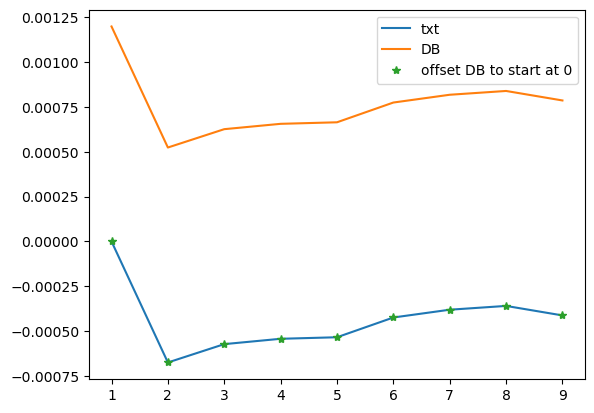

In [158]:
#Buddy: Non-cumulative position delta to be used for next measurement (for set4). 
#             Make this move relative to current position.
# Bo: these are in M1B. in meter
# Bo: read first niter (=8) folders, add a 0 at beginning
txt_posi = np.zeros((9,6)) #iter1 position is 0, we have command for iter10, but we ignore it
for iiter in range(1,9): #ignore what is in the last folder
    globstring = '%s/Sec 11/27 modes/%s_%s/position.txt'%(ml_data_dir,dateID, iiter)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1
    txt_posi[iiter,:] = txt_posi[iiter-1,:] + np.loadtxt(fileset[0])

plt.plot(np.arange(1,9+1), txt_posi[:,1], label='txt') 
plt.plot(np.arange(1,9+1), mp[:,1], label='DB')
plt.plot(np.arange(1,9+1), mp[:,1]- mp[0,1], '*', label='offset DB to start at 0')
plt.legend();

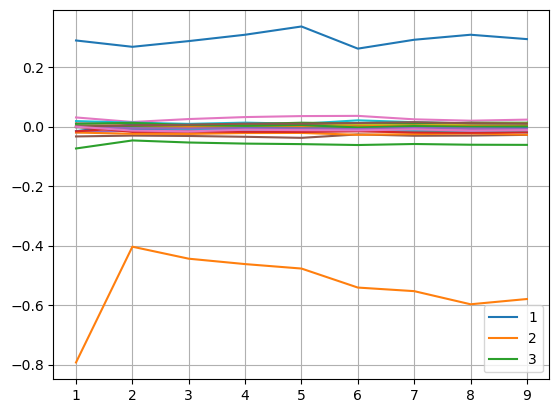

In [159]:
for modeID in np.arange(1, nfitmode+1):
    labelString = ''
    if modeID in [1,2,3]: #np.max(np.abs(bm_coeff[1:,modeID-1]))>0.1:
        labelString = '%d'%modeID
    plt.plot(np.arange(1, niter+1), bm_coeff[:, modeID-1], label=labelString)
plt.grid()
plt.legend();

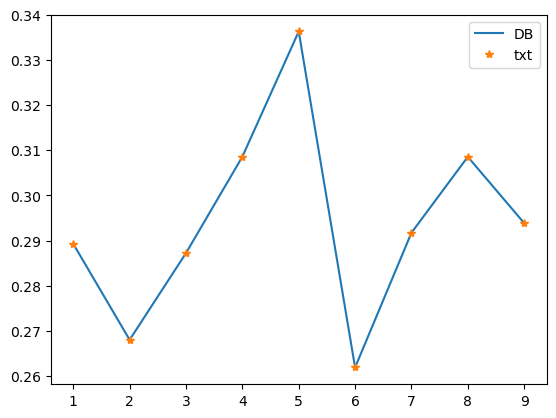

In [180]:
#Buddy: Cumulative force delta used for current measurement (set3) 
# Bo: these are in M1B. in N. These are same as bending forces in M1DCS.
# Bo: read all 9 folders prevForces.txt
txt_bm = np.zeros((9,nfitmode)) #iter1 position is 0, we have command for iter10, but we ignore it
for iiter in range(1,9+1): #ignore what is in the last folder
    globstring = '%s/Sec 11/27 modes/%s_%s/prevForce*.txt'%(ml_data_dir,dateID, iiter)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1
    df = pd.read_csv(fileset[0], header=None)
    txt_bm[iiter-1,:] = VMat[:, :nfitmode].transpose() @ np.array(df[1]) / np.sum(VMat[:,:nfitmode]**2, axis=0)

modeID=1
plt.plot(np.arange(1, niter+1), bm_coeff[:, modeID-1], label='DB')
plt.plot(np.arange(1, niter+1), txt_bm[:, modeID-1], '*', label='txt')
plt.legend();

### Dave wants to see updated iter3-predicted with xtalk taken into account

- Buddy's predicted map is with gain=1
- we know the bending force and coeff with gain=0.9 applied.

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 11/27 modes/250131_3/250131 GMT3 set3 27 modes gmtMorph170614 LFSsub comp - stitched patched - 27 GMT modes.h5: date not in h5 file. 
25.308420194577902


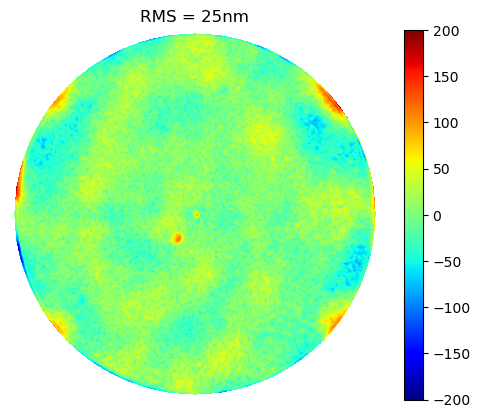

In [243]:
from scipy.interpolate import LinearNDInterpolator 
from scipy.interpolate import griddata

dateID = '250131'
iiter = 3 #we are at iter3
bm_next_iter = bm_coeff[iiter+1-1,:] - bm_coeff[iiter+1-2,:]
bm_full = bm_next_iter/0.9*1.0
globstring = '%s/Sec 11/27 modes/%s_%s/%s*set*patched - 27 GMT modes.h5'%(ml_data_dir,dateID, iiter, dateID)
#print(globstring)
fileset = sorted(glob.glob(globstring))
assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
m1s,centerRow,centerCol,pixelSize,ts = readH5Map(fileset) 
m1s = -m1s.T #convert into M1B. unit is micron
mask = ~np.isnan(m1s)

#[x1, y1] are the x and y grid in M1B. 
#CenterCol and centerRow are swapped, because they were meant for h5 CS
#Lines below, we will transpose the h5 map to match this.
#.  we will also reverse the sign of h5 maps to be in M1B.
[x1, y1] = mkXYGrid(m1s, centerCol, centerRow, pixelSize)
interp = LinearNDInterpolator(list(zip(x1[mask], y1[mask])), m1s[mask], fill_value=0)
mapOntoGMTFEgrid = interp(nodex, nodey).ravel()
for i in range(bm_coeff.shape[1]):
    mapOntoGMTFEgrid -= bm_full[i]*UMat[:,i] #restore map to RB correction only
if 1: #use 0 here for checking RB only surface prediction ---------------------
    xtalk = np.loadtxt('../model_data/GMT_xtalk_square.txt')
    #xtalk = np.eye(27) #for testing purposes--------------------
    bm_real = np.zeros_like(bm_full)
    for i in range(bm_coeff.shape[1]):
        bm_real += bm_full[i]*xtalk[:,i]
    #bm_real*=0.9   #if we predict with a gain -----------------------
    for i in range(bm_coeff.shape[1]):
        mapOntoGMTFEgrid += bm_real[i]*UMat[:,i] #add to map the real correction we are applying based on xtalk
grid_z = griddata((nodex, nodey), mapOntoGMTFEgrid, (x1,y1), method='linear')    
grid_z = -grid_z.T #back to optical CS
plt.imshow(grid_z*1e3, origin='lower', vmin=-200, vmax=200)
plt.axis('off')
m1rms = 1e3*np.std(grid_z[~np.isnan(grid_z)])
plt.title('RMS = %.0fnm'%(m1rms))
print(m1rms)
plt.colorbar();

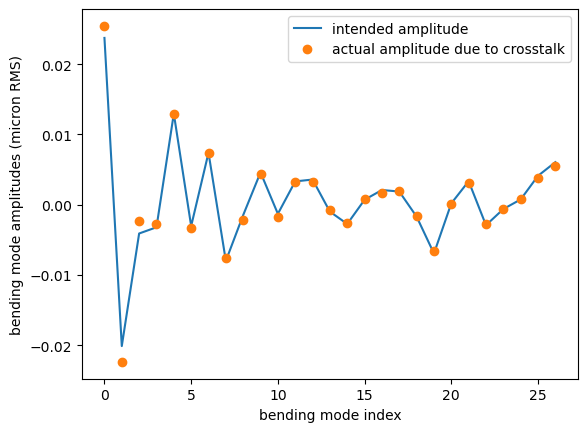

In [242]:
plt.plot(bm_full, label='intended amplitude')
plt.plot(bm_real, 'o', label='actual amplitude due to crosstalk')
plt.xlabel('bending mode index')
plt.ylabel('bending mode amplitudes (micron RMS)')
plt.legend();

In [239]:
dateID = '250131'
iiter = 3 #we are at iter3
bm_next_iter = bm_coeff[iiter+1-1,:] - bm_coeff[iiter+1-2,:]
bm_full = bm_next_iter/0.9*1.0
bm_real = np.zeros_like(bm_full)
for i in range(27):
    bm_real += bm_full[i]*xtalk[:,i]

## This can make a nice plot. We can use it for animation later. But DB query takes a few minutes.

In [258]:
nfitmode = 27
ntsamples = 100
bm_coeff = np.zeros((ntsamples, nfitmode))
mp = np.zeros((ntsamples, 6))
start_time = unix_ts(ts_array[0])-60*6 - 60 #1 minute before starting the first measurement
end_time = unix_ts(ts_array[-1])+60*5 #5 minute after the last measurement

bend_force, tt = getDBData(start_time,'m1_s1_support_ctrl/s/sa_bending_force/value', 
                           duration_in_s=end_time-start_time, samples=ntsamples)
bend_force_z = bend_force[:,:,2]
for i in range(ntsamples):
    bm_coeff[i,:] = VMat[:, :nfitmode].transpose() @ gmt170Fvec2gmt165Fvec(bend_force_z[i,:]) / np.sum(VMat[:,:nfitmode]**2, axis=0)
mirror_pos, tt = getDBData(start_time,'m1_s1_support_ctrl/s/mirror_position/value', 
                               duration_in_s=end_time-start_time, samples=ntsamples)

m1_s1_support_ctrl/s/sa_bending_force/value
2025-01-31 10:18:48  duration =  8080  s
(100, 170, 3)
(100, 170, 3)
m1_s1_support_ctrl/s/mirror_position/value
2025-01-31 10:18:48  duration =  8080  s
(100, 6)
(100, 6)


In [249]:
#nzer = int(#(6*7)/2+1)
nzer = int((8*9)/2+1) 
zercoeff = np.zeros((niter, nzer))

[x1, y1] = mkXYGrid(m1s, centerRow, centerCol, pixelSize)
r1 = np.sqrt(x1**2 + y1**2)

nnodes = x1.shape[0]*x1.shape[1]
zerU = np.zeros((nnodes, nzer))
for i in range(nzer):
    zerU[:,i] = zernike_polynomial(i+1, x1/radius_of_CA, y1/radius_of_CA).flatten()

dateID = '250131'
for i in range(9):

    globstring = '%s/Sec 11/27 modes/%s_%s/%s*set*patched.h5'%(ml_data_dir,dateID, i+1, dateID)
    #print(globstring)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow1,centerCol1,pixelSize1,ts = readH5Map(fileset, verbose=False)
    m1s *= 1000 #convert into nm
    
    maskNew = (~np.isnan(m1s) ) & (r1<radius_of_CA)
    nnodesNew = np.sum(maskNew)
    zercoeff[i,:] = zerU[maskNew.flatten(),:].transpose() / nnodesNew @ m1s[maskNew]

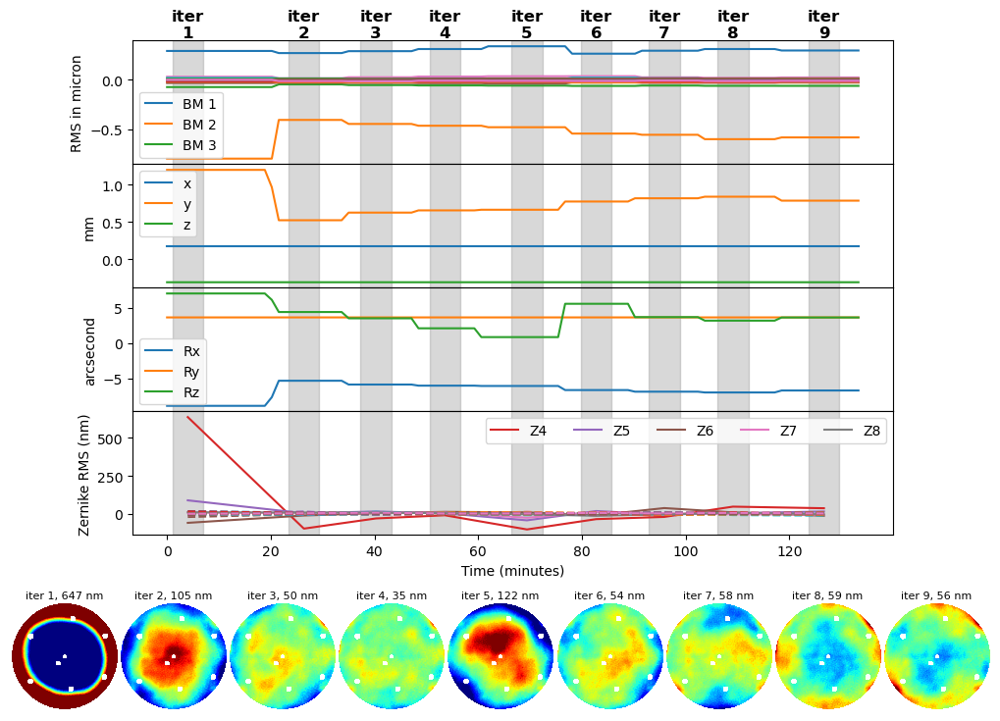

In [291]:
fileIdenti = '%s/Sec 11/27 modes/%s_XX/%s*set*patched.h5'%(ml_data_dir,dateID, dateID)
# Compute elapsed time in minutes from t0
t0 = tt[0]  # Start time (first timestamp)
tt_minutes = (tt - t0) / 60  # Convert to minutes
ts_minutes = ([unix_ts(t) for t in ts_array] - t0) / 60  # Convert ts_array to minutes
band_width = 6  # Width in minutes

figsize = (10, 8)  # Overall figure size
# Create the figure with 4 subplots sharing the x-axis
fig, ax = plt.subplots(4, 1, figsize=figsize, sharex=True, gridspec_kw={'height_ratios': [1, 1, 1, 1]})
# Remove gaps between the first 4 subplots and leave space for row 5
plt.subplots_adjust(hspace=0, bottom=0.25)  # bottom=0.2 ensures space for images

for modeID in np.arange(1, nfitmode+1):
    labelString = ''
    if modeID in [1,2,3]: #np.max(np.abs(bm_coeff[1:,modeID-1]))>0.1:
        labelString = 'BM%2d'%modeID
    ax[0].plot(tt_minutes, bm_coeff[:, modeID-1], label=labelString)
ax[0].legend()

for idof, slabel in enumerate(['x','y','z']):
    ax[1].plot(tt_minutes, mirror_pos[:,idof]*1e3, label=slabel) #now in mm
ax[1].legend()

for idof, slabel in enumerate(['Rx','Ry','Rz']):
    ax[2].plot(tt_minutes, mirror_pos[:,idof+3]*rad2arcsec, label=slabel) #now in arcsec
ax[2].legend()
plt.subplots_adjust(hspace=0)
ax[0].set_ylabel('RMS in micron')
ax[1].set_ylabel('mm')
ax[2].set_ylabel('arcsecond')

for izer in range(nzer):
    condi = (izer+1>=4) and (izer+1<=8) #np.max(abs(zercoeff[:, izer]))>100
    labelString = 'Z%d'%(izer+1) if condi else None
    linestyle = '-' if condi else '--'
    ax[3].plot(ts_minutes-band_width/2., zercoeff[:, izer], linestyle ,label=labelString)
ax[3].legend(ncol=5)
ax[3].set_ylabel('Zernike RMS (nm)')
if 1:
    for j in range(4):
        for i,t in enumerate(ts_minutes):
            ax[j].axvspan(t - band_width, t, color='gray', alpha=0.3)  # Ends at t, goes back 6 min
            if j==0:
                ax[j].text(t - band_width / 2, ax[0].get_ylim()[1], f"iter\n{i + 1}", 
                        color='black', fontsize=12, fontweight='bold',
                        ha='center', va='bottom')  # Label bands at the top center        
ax[3].set_xlabel('Time (minutes)')
# Add images using additional axes
for i in range(niter):
    left = i / niter  # Normalize the position
    width = 1 / niter  # Normalize the width
    ax_img = fig.add_axes([left, 0.02, width, 0.15])  # [x, y, width, height] in figure coordinates
    
    globstring = fileIdenti.replace('XX', '%d'%(i+1))
    #print(globstring)
    fileset = sorted(glob.glob(globstring))
    assert len(fileset)==1 #for optimization, Buddy decided to do ONE measurements per iteration
    m1s,centerRow1,centerCol1,pixelSize1,ts = readH5Map(fileset, verbose=False)
    m1s *= 1000 #convert into nm
    m1rms = np.std(m1s[~np.isnan(m1s)])
    
    ax_img.imshow(m1s, origin='lower', vmin=-200, vmax=200)
    ax_img.set_title('iter %d, %.0f nm'%(i+1, m1rms), fontsize=8, pad=3)
    ax_img.axis("off")  # Hide axes for clean layout

In [280]:
fileIdenti.replace('XX', '%d'(i+1))

<>:1: SyntaxWarning: 'str' object is not callable; perhaps you missed a comma?
<>:1: SyntaxWarning: 'str' object is not callable; perhaps you missed a comma?
/var/folders/xy/hgbs8nzs7jjbtrg3cpgv4zmsqt1xg5/T/ipykernel_56299/3927628060.py:1: SyntaxWarning: 'str' object is not callable; perhaps you missed a comma?
  fileIdenti.replace('XX', '%d'(i+1))


TypeError: 'str' object is not callable

In [ ]:
    
    img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-200, vmax=200)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol]
    ax[irow][icol].axis('off')

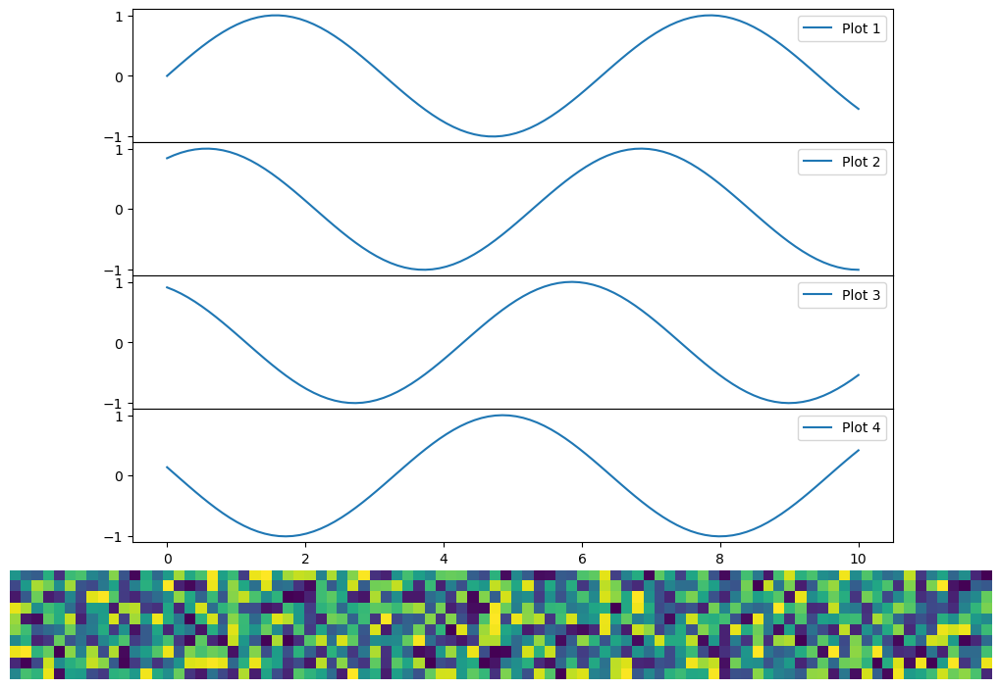

In [274]:


# Generate and plot niter images in the 5th row
images = [np.random.rand(10, 10) for _ in range(niter)]


plt.show()
